<a href="https://colab.research.google.com/github/peeyushsinghal/image-segmentation/blob/main/massachusetts_roads_dataset_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Downloading the data
The data is downloaded from kaggle to personal google drive.

**Rationale**: It is possible to download the kaggle data to sample_data (in Google Colab), however due to interupptions / server time out the data is also lost and it takes time to download around 5-6 GB of data.

Two options exists - either upload the kaggle.json file or use API key to directly create the kaggle.json file 


In [ ]:
#  ! pip install -q kaggle # installs kaggle utility

In [ ]:
## Option 1 - either upload the kaggle.json file
# from google.colab import files # upload the kaggle.json file here (see : https://www.kaggle.com/general/74235)
# files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"psi1280643","key":"203d335a3f06035cfa8f8b7a82868b7d"}'}

In [1]:
# Mounting Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
### Creating Kaggle directory in Colab and putting kaggle.json in it
# ! mkdir ~/.kaggle
# ! cp kaggle.json ~/.kaggle/
# ! chmod 600 ~/.kaggle/kaggle.json

### Option 2 : Use of API Key directly
# !echo '{"username":"psi1280643","key":"203d335a3f06035cfa8f8b7a82868b7d"}' > /root/.kaggle/kaggle.json
# ! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
#! kaggle datasets list # for checking if everything is working

ref                                                           title                                              size  lastUpdated          downloadCount  
------------------------------------------------------------  ------------------------------------------------  -----  -------------------  -------------  
gpreda/reddit-vaccine-myths                                   Reddit Vaccine Myths                              232KB  2021-06-26 07:50:27           8367  
crowww/a-large-scale-fish-dataset                             A Large Scale Fish Dataset                          3GB  2021-04-28 17:03:01           5124  
imsparsh/musicnet-dataset                                     MusicNet Dataset                                   22GB  2021-02-18 14:12:19           1741  
promptcloud/careerbuilder-job-listing-2020                    Careerbuilder Job Listing 2020                     42MB  2021-03-05 06:59:52           1168  
coloradokb/dandelionimages                                    Da

In [ ]:
## The below is not used
## the below command downloads the data on colab, it is commented out at the moment
## !kaggle datasets download insaff/massachusetts-roads-dataset/ -p /content/sample_data/ --unzip

In [ ]:
# The below is used - one time activity the below command downloads the data on google drive.
# !kaggle datasets download insaff/massachusetts-roads-dataset/ -p /content/gdrive/My\ Drive/image-segment-dataset --unzip

### Importing Libraries

In [ ]:
import os
from IPython.display import display, Image
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import numpy as np
import pandas as pd

### Setting Global Variables / Constants

In [ ]:
base_dir = '/content/sample_data/road_segmentation_ideal'
train_dir = os.path.join(base_dir,'training')
train_input_dir = os.path.join(train_dir,'input')
train_output_dir = os.path.join(train_dir,'output')
test_dir = os.path.join(base_dir,'testing')

### Exploratory Data Analysis
We would do exploratory data analysis to understand more about the data.

In [ ]:
# function to return all file names in directory in an array
def return_all_file_names(path,extn=".png"):
    all_files =[]
    for file in os.listdir(path):
        if file.endswith(extn):
          all_files.append(file)
    return all_files

In [ ]:
# funtion to get the common file names between two directories
def get_common_file_names(dir1,dir2):
  dir1_file_names = return_all_file_names(dir1)
  dir2_file_names = return_all_file_names(dir2)
  common_file_names = list(set(dir1_file_names)&set(dir2_file_names))
  ratio_dir1 = round(len(common_file_names)/len(dir1_file_names),2)
  ratio_dir2 = round(len(common_file_names)/len(dir2_file_names),2)
  return common_file_names,ratio_dir1,ratio_dir2

In [ ]:
# function to display image from a directory
def show_image(img_dir,img_name):
  img_path = os.path.join(img_dir,img_name)
  display(Image(filename=img_path))

In [ ]:
# function to display image from input and corresponding output from a directory, assumption the file names are accurate.
def show_common_image(img_dir1, img_dir2, img_name):
  list_images=[os.path.join(img_dir1,img_name),os.path.join(img_dir2,img_name)]
  fig = plt.figure(figsize=(200, 400))
  for i in range(2):
    fig.add_subplot(1, 2, i+1)
    plt.imshow(mpimg.imread(list_images[i]))
  plt.show

In [ ]:

common_file_names,ratio_dir1,ratio_dir2=get_common_file_names(train_input_dir,train_output_dir) # represents files which has both input and output
print("Ratio of Number of Images in Input Directory to Common Images: {} , total number of input images: {}".format (ratio_dir1,len(return_all_file_names(train_input_dir)))) 
print("Ratio of Number of Images in Output Directory to Common Images: {}, total number of output images: {}".format(ratio_dir2,len(return_all_file_names(train_output_dir)))) 


Ratio of Number of Images in Input Directory to Common Images: 0.73 , total number of input images: 1105
Ratio of Number of Images in Output Directory to Common Images: 1.0, total number of output images: 804


***Only 73% of the input files have corresponding output files. ***




In [ ]:
# selecting random image
idx = random.randint(0,len(common_file_names))
print(common_file_names[idx])

In [ ]:
# show_image(train_input_dir,common_file_names[idx])
# show_image(train_output_dir,common_file_names[idx])
# Show Common Image
show_common_image(train_input_dir,train_output_dir,common_file_names[idx])

In [ ]:
# Analyzing a random image
img_path_train_input = os.path.join(train_input_dir,common_file_names[idx])
img_path_train_output = os.path.join(train_output_dir,common_file_names[idx])
img_read = cv2.imread(img_path_train_output)
print("image shape: ",img_read.shape)

img_axis_2 = np.sum(img_read, axis=2) # axis 2 adds up all the values across RGB channels
print ("image shape, axis 2 shape: ",img_axis_2.shape)
img_axis_2_unique_elements = list(np.unique(img_axis_2))
print("unique elements in image: ", img_axis_2_unique_elements)

image shape:  (1500, 1500, 3)
image shape, axis 2 shape:  (1500, 1500)
unique elements in image:  [0, 765]


**Given that the unique elements are 0 or 765 (255*3), the image only consists of either 0 or 255 pixel values. Now we would check, what is the distribution of the pixel values in all the images**

In [ ]:
# function to calculate pixel distribution
def pixel_distribution (image):
  temp_img_read = cv2.imread(image)
  temp_img_axis_2 = np.sum(temp_img_read, axis=2)
  unique,counts = np.unique(temp_img_axis_2,return_counts=True)
  return dict(zip(unique, counts))

In [ ]:
# getting pixel distribution for all the common images
distribution_pixel=[]
for file_idx,file in enumerate(common_file_names):
  temp_img_path_train_output = os.path.join(train_output_dir, file)
  distribution = pixel_distribution(temp_img_path_train_output)
  distribution_pixel.append([file,distribution])
print (distribution_pixel[:10]) # sample print

[['img-621.png', {0: 2034733, 765: 215267}], ['img-482.png', {0: 2134474, 765: 115526}], ['img-346.png', {0: 2233416, 765: 16584}], ['img-129.png', {0: 2037003, 765: 212997}], ['img-371.png', {0: 2160082, 765: 89918}], ['img-319.png', {0: 2207543, 765: 42457}], ['img-57.png', {0: 2071807, 765: 178193}], ['img-311.png', {0: 2042822, 765: 207178}], ['img-36.png', {0: 2166221, 765: 83779}], ['img-627.png', {0: 2073685, 765: 176315}]]


In [ ]:
# checking if any file is all white or all black
list_blank_image=[]
for item in distribution_pixel:
  temp_name = item[0] #Name of file
  temp_dict = item[1] #Distribution   
  if (temp_dict[0]==0 or temp_dict[765]==0):
    list_blank_image.append(temp_name)
print(list_blank_image)

[]


**No Output image is either all black or all white**

In [ ]:
# function to get the pixel ratio in output images
# distribution_pixel includes a list with element comprising of file name and distribution
def get_pixel_ratio (distribution_pixel): 
  list_dict_distribution_ratio=[]
  for item in distribution_pixel:
    temp_name = item[0] #Name of file
    temp_dict = item[1] #Distribution  
    dict_distribution_ratio =dict()
    total_pixels = sum(list(temp_dict.values()))
    # print(total_pixels)
    for key in temp_dict:
      dict_distribution_ratio[key]=round(temp_dict[key]/total_pixels,2)
    list_dict_distribution_ratio.append(dict_distribution_ratio)
  return list_dict_distribution_ratio

In [ ]:
df_pixel_ratio=pd.DataFrame(get_pixel_ratio(distribution_pixel)) # converting into a df for easy plotting
df_pixel_ratio.columns = ['black','white']
print(df_pixel_ratio)

     black  white
0     0.90   0.10
1     0.95   0.05
2     0.99   0.01
3     0.91   0.09
4     0.96   0.04
..     ...    ...
799   0.95   0.05
800   0.95   0.05
801   0.92   0.08
802   0.92   0.08
803   0.98   0.02

[804 rows x 2 columns]


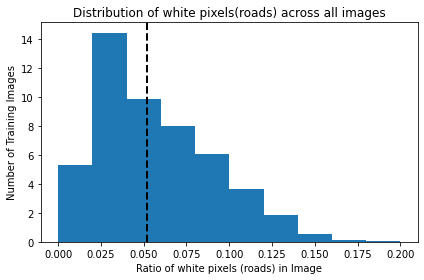

In [ ]:
fig, ax = plt.subplots()
ax.hist(df_pixel_ratio['white'], density=True)
ax.set_xlabel('Ratio of white pixels (roads) in Image')
ax.set_ylabel('Number of Training Images')
ax.set_title('Distribution of white pixels(roads) across all images')
plt.axvline(df_pixel_ratio['white'].mean(), color='k', linestyle='dashed', linewidth=2)
fig.tight_layout()
plt.show()

Given that the white pixels are very less in an image output, also the mean is around 5%, this implies a case of imbalanced data set. 
**Impact**

1.   Techniques which are highly accurate should be deployed
2.   Data Augmentation if required, should considered data where the density is greater than 5% for helping learn the model better.
3.  Loss function should also cater for imbalenced class. Since it is a two class problem (road and no road) and if it had been a balanced dataset, binary cross entropy (last layer is sigmoid) would have been sufficient. However, in this case it is advisable to use Dice Loss or Weighted Binary Cross Entropy to be used.


